#### Import packages 

In [93]:
import pandas as pd
import geopandas as gpd
import numpy as np
from pysal.lib import weights
from splot.libpysal import plot_spatial_weights
from esda.moran import Moran, Moran_Local
from splot.esda import moran_scatterplot, plot_local_autocorrelation, lisa_cluster
import matplotlib.pyplot as plt
import folium
import matplotlib.colors as colors

#### Analysis region: Christchurch

<Axes: >

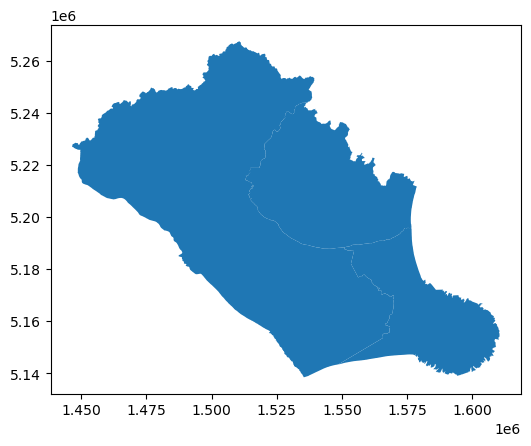

In [94]:
TA = gpd.read_file('GIS_file/territorial-authority-2021-generalised.gpkg')

dis_3 = TA.loc[TA.TA2021_V1_00_NAME.str.contains('Christchurch|Waimakariri|Selwyn'), :]

# buffer 1km
# dis_3 = dis_3

dis_3.plot()

In [95]:
TA.head()

,TA2021_V1_00,TA2021_V1_00_NAME,TA2021_V1_00_NAME_ASCII,LAND_AREA_SQ_KM,AREA_SQ_KM,Shape_Length,geometry
0,032,Central Hawke's Bay District,Central Hawke's Bay District,3333.140233,3333.140233,345764.275012,"MULTIPOLYGON (((1884831.019 5593384.334, 18848..."
1,033,New Plymouth District,New Plymouth District,2205.597503,2205.597503,376935.584957,"MULTIPOLYGON (((1687622.432 5675977.675, 16876..."
2,034,Stratford District,Stratford District,2163.422393,2163.422393,410331.506021,"MULTIPOLYGON (((1761018.863 5693193.903, 17610..."
3,035,South Taranaki District,South Taranaki District,3575.070736,3575.070736,374629.309041,"MULTIPOLYGON (((1671999.338 5662834.92, 167202..."
4,036,Ruapehu District,Ruapehu District,6734.415584,6734.415584,645988.018205,"MULTIPOLYGON (((1803138.895 5728331.12, 180343..."


In [96]:
# read in grid_1km_canterbury.shp
grid_1km = gpd.read_file('/home/ztang/canterbury_birds/Canterbury_birds/GIS_file/grid_1km_canterbury.shp').to_crs(2193)
grid_1km = grid_1km

In [97]:
grid_1km.crs

<Projected CRS: EPSG:2193>
Name: NZGD2000 / New Zealand Transverse Mercator 2000
Axis Info [cartesian]:
- N[north]: Northing (metre)
- E[east]: Easting (metre)
Area of Use:
- name: New Zealand - North Island, South Island, Stewart Island - onshore.
- bounds: (166.37, -47.33, 178.63, -34.1)
Coordinate Operation:
- name: New Zealand Transverse Mercator 2000
- method: Transverse Mercator
Datum: New Zealand Geodetic Datum 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

read in cbirds_gdf, this file merged with 1km grids already

In [98]:
# read in cbirds_gdf.gpkg
cbirds_gdf = gpd.read_file('/home/ztang/canterbury_birds/Canterbury_birds/GIS_file/cbirds_grid.gpkg')
cbirds_gdf.head()

,CENTROID_X,CENTROID_Y,GridID,Shape_Leng,index_right,last_edited_date,common_name,locality,migration_type,observation_count,month,geometry
0,1382500.0,5022500.0,E13825N50225,4000.0,63830,2024-01-02,New Zealand Falcon,Buster Diggings Mount Buster,N,1,1,"MULTIPOLYGON (((1382000 5023000, 1383000 50230..."
1,1378500.0,5027500.0,E13785N50275,4000.0,20725,2024-07-12,Yellowhammer,AN151,N,1,7,"MULTIPOLYGON (((1378000 5028000, 1379000 50280..."
2,1378500.0,5027500.0,E13785N50275,4000.0,20443,2024-07-12,Dunnock,AN151,N,1,7,"MULTIPOLYGON (((1378000 5028000, 1379000 50280..."
3,1378500.0,5027500.0,E13785N50275,4000.0,20723,2024-07-12,Yellowhammer,AN151,N,1,7,"MULTIPOLYGON (((1378000 5028000, 1379000 50280..."
4,1378500.0,5027500.0,E13785N50275,4000.0,20713,2024-07-12,Yellowhammer,AN151,N,1,7,"MULTIPOLYGON (((1378000 5028000, 1379000 50280..."


In [99]:
cbirds_gdf.columns

Index(['CENTROID_X', 'CENTROID_Y', 'GridID', 'Shape_Leng', 'index_right',
       'last_edited_date', 'common_name', 'locality', 'migration_type',
       'observation_count', 'month', 'geometry'],
      dtype='object')

try un sjoined birds data set to follow the lab material

In [100]:
cbird = pd.read_csv('/home/ztang/canterbury_birds/Canterbury_birds/GIS_file/cbirds_filtered.csv')
print(cbird.head())

  LAST EDITED DATE  TAXONOMIC ORDER CATEGORY          COMMON NAME  \
0       2023/01/11           6851.0     spuh        albatross sp.   
1       2023/01/11           6851.0     spuh        albatross sp.   
2       2023/12/11           7167.0  species  Australasian Gannet   
3       2023/01/18           7167.0  species  Australasian Gannet   
4       2023/10/17           7167.0  species  Australasian Gannet   

   SCIENTIFIC NAME EXOTIC CODE OBSERVATION COUNT BREEDING CODE  \
0  Diomedeidae sp.         NaN                 1           NaN   
1  Diomedeidae sp.         NaN                 4           NaN   
2   Morus serrator         NaN                 1           NaN   
3   Morus serrator         NaN                 1           NaN   
4   Morus serrator         NaN                 2           NaN   

  BREEDING CATEGORY BEHAVIOR CODE  ... ATLAS BLOCK  \
0               NaN           NaN  ...         NaN   
1               NaN           NaN  ...     blkCI59   
2               NaN       

In [101]:
cbird.columns

# covert columns to lower case
cbird.columns = cbird.columns.str.lower()


In [102]:
#Convert Lat/Long to geometry
cbird_dis_3 = gpd.GeoDataFrame(cbird, geometry=gpd.points_from_xy(cbird.longitude, cbird.latitude), crs="EPSG:4326")\
.to_crs(2193).clip(dis_3)

Select useful cols and slipt date to month

In [103]:
cbird_dis_3.columns

Index(['last edited date', 'taxonomic order', 'category', 'common name',
       'scientific name', 'exotic code', 'observation count', 'breeding code',
       'breeding category', 'behavior code', 'state code', 'county',
       'county code', 'iba code', 'atlas block', 'locality', 'locality id',
       'locality type', 'latitude', 'longitude', 'observation date',
       'time observations started', 'approved', 'migration_type', 'geometry'],
      dtype='object')

In [104]:
# add underscore to column names
cbird_dis_3.columns = cbird_dis_3.columns.str.replace(' ', '_')

In [105]:
cbird_dis_3.head(3)

,last_edited_date,taxonomic_order,category,common_name,scientific_name,exotic_code,observation_count,breeding_code,breeding_category,behavior_code,...,locality,locality_id,locality_type,latitude,longitude,observation_date,time_observations_started,approved,migration_type,geometry
61155,2023/04/22,7236.0,species,Spotted Shag,Phalacrocorax punctatus,NaN,1,NaN,NaN,NaN,...,Rakaia Huts,L1037809,H,-43.888274,172.239661,2023/04/09,15:05:00,1.0,N,POINT (1538926.165 5140255.224)
45808,2023/03/06,25335.0,species,Silvereye,Zosterops lateralis,NaN,4,NaN,NaN,NaN,...,Rakaia Huts,L1037809,H,-43.888274,172.239661,2023/03/06,19:29:00,1.0,N,POINT (1538926.165 5140255.224)
45436,2023/03/06,20015.0,species,New Zealand Fantail,Rhipidura fuliginosa,NaN,1,NaN,NaN,NaN,...,Rakaia Huts,L1037809,H,-43.888274,172.239661,2023/03/06,19:29:00,1.0,N,POINT (1538926.165 5140255.224)


In [106]:
# select only the columns we need 
cols = ['last_edited_date', 'common_name', 'locality', 'migration_type',
       'observation_count', 'geometry']

cbirds_dis_3 = cbird_dis_3[cols]

# Ensure 'last_edited_date' is in datetime format
cbirds_dis_3['last_edited_date'] = pd.to_datetime(cbirds_dis_3.loc[:,'last_edited_date'])

# split the date to month column
cbirds_dis_3['month'] = cbirds_dis_3.loc[:,'last_edited_date'].dt.month

print(cbirds_dis_3.head())
print(cbirds_dis_3.dtypes)






      last_edited_date          common_name     locality migration_type  \
61155       2023-04-22         Spotted Shag  Rakaia Huts              N   
45808       2023-03-06            Silvereye  Rakaia Huts              N   
45436       2023-03-06  New Zealand Fantail  Rakaia Huts              N   
60940       2023-04-22          Silver Gull  Rakaia Huts              N   
60683       2023-04-07    New Zealand Scaup  Rakaia Huts              N   

      observation_count                         geometry  month  
61155                 1  POINT (1538926.165 5140255.224)      4  
45808                 4  POINT (1538926.165 5140255.224)      3  
45436                 1  POINT (1538926.165 5140255.224)      3  
60940                 1  POINT (1538926.165 5140255.224)      4  
60683                50  POINT (1538926.165 5140255.224)      4  
last_edited_date     datetime64[ns]
common_name                  object
locality                     object
migration_type               object
observati

/home/ztang/miniforge3/envs/deepl1/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/ztang/miniforge3/envs/deepl1/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [107]:
cbirds_dis_3.dtypes

last_edited_date     datetime64[ns]
common_name                  object
locality                     object
migration_type               object
observation_count            object
geometry                   geometry
month                         int32
dtype: object

In [108]:
cbirds_dis_3['observation_count'].unique()

array(['1', '4', '50', '3', '40', '20', '2', '66', '30', '12', '6', '38',
       '28', '27', '13', '9', '10', '8', '22', '39', '7', '15', '25',
       '14', '100', '32', '5', '46', '19', '24', '200', '26', '78', '300',
       '160', 'X', '36', '70', '306', '11', '120', '90', '35', '17',
       '510', '115', '29', '80', '450', '237', '16', '250', '281', '500',
       '294', '23', '400', '21', '45', '31', '37', '34', '110', '42',
       '57', '67', '60', '54', '55', '111', '172', '71', '48', '150',
       '109', '18', '148', '547', '427', '967', '374', '267', '900', '41',
       '1250', '211', '404', '523', '470', '198', '52', '61', '43', '305',
       '650', '75', '2000', '51', '140', '84', '44', '97', '108', '187',
       '127', '128', '33', '146', '76', '62', '350', '64', '47', '63',
       '56', '598', '1150', '600', '123', '186', '342', '105', '92', '53',
       '130', '59', '58', '104', '85', '65', '49', '290', '800', '220',
       '390', '380', '790', '230', '139', '671', '247', '

In [109]:
cbirds_dis_3.loc[:,'observation_count'] = cbirds_dis_3['observation_count'].replace('X', '1')


In [110]:
# convert obersevation count to numeric and categorize the migration type
cbirds_dis_3['observation_count'] = cbirds_dis_3.loc[:,'observation_count'].astype('int')

cbirds_dis_3['migration_type'] = cbirds_dis_3.loc[:,'migration_type'].astype('category')

/home/ztang/miniforge3/envs/deepl1/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/ztang/miniforge3/envs/deepl1/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [111]:
cbirds_dis_3.dtypes

last_edited_date     datetime64[ns]
common_name                  object
locality                     object
migration_type             category
observation_count             int64
geometry                   geometry
month                         int32
dtype: object

In [112]:
cbirds_dis_3.head(3)

,last_edited_date,common_name,locality,migration_type,observation_count,geometry,month
61155,2023-04-22,Spotted Shag,Rakaia Huts,N,1,POINT (1538926.165 5140255.224),4
45808,2023-03-06,Silvereye,Rakaia Huts,N,4,POINT (1538926.165 5140255.224),3
45436,2023-03-06,New Zealand Fantail,Rakaia Huts,N,1,POINT (1538926.165 5140255.224),3


<Axes: >

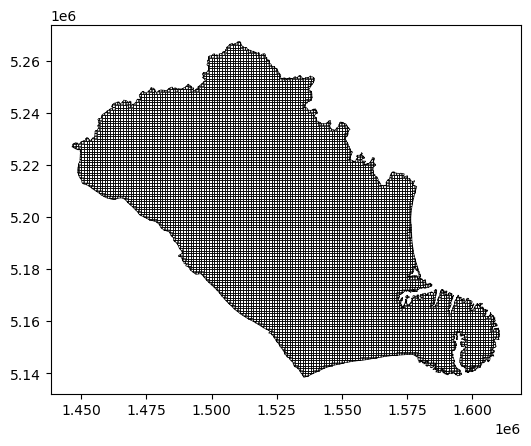

In [113]:
#Load shapefile and clip to dis_3
unit = grid_1km.clip(dis_3)

# plot the unit and highlight the grid
unit.plot(edgecolor='black', facecolor='none', linewidth=0.5)



#### split the cbirds_gdf_new into two dataframes: nbirds and nbirds by migration_type

In [114]:
# split the cbirds_gdf_new into two dataframes: nbirds and nbirds by migration_type
nbirds = cbirds_dis_3[cbirds_dis_3['migration_type'] == 'N']
mbirds = cbirds_dis_3[cbirds_dis_3['migration_type'] == 'M']
print(nbirds.shape)
print(mbirds.shape)

(47926, 7)
(502, 7)


In [115]:
# filter nbirds and mbirds by month which is (1-3)
nbirds = nbirds[nbirds['month'].isin([1,2,3])]
mbirds = mbirds[mbirds['month'].isin([1,2,3])]
print(nbirds.shape)
print(mbirds.shape)


(23915, 7)
(214, 7)


In [116]:
unit

,CENTROID_X,CENTROID_Y,GridID,Shape_Leng,geometry
11145,1535500.0,5138500.0,E15355N51385,4000.0,"POLYGON ((1536000 5139000, 1536000 5138690.181..."
11166,1534500.0,5139500.0,E15345N51395,4000.0,"POLYGON ((1535000 5140000, 1535000 5139186.138..."
11278,1535500.0,5139500.0,E15355N51395,4000.0,"POLYGON ((1536000 5140000, 1536000 5139000, 15..."
22046,1533500.0,5140500.0,E15335N51405,4000.0,"POLYGON ((1534000 5141000, 1534000 5140744.267..."
22047,1534500.0,5140500.0,E15345N51405,4000.0,"POLYGON ((1535000 5141000, 1535000 5140000, 15..."
...,...,...,...,...,...
42939,1507500.0,5265500.0,E15075N52655,4000.0,"POLYGON ((1508000 5266000, 1508000 5265000, 15..."
42941,1506500.0,5266500.0,E15065N52665,4000.0,"POLYGON ((1506805.03 5266000, 1506838.918 5266..."
42942,1507500.0,5266500.0,E15075N52665,4000.0,"POLYGON ((1507002.399 5266256.213, 1507010.591..."
42953,1508500.0,5266500.0,E15085N52665,4000.0,"POLYGON ((1508038.603 5266437.32, 1508048.216 ..."


In [117]:
cbirds_dis_3.head(3)

,last_edited_date,common_name,locality,migration_type,observation_count,geometry,month
61155,2023-04-22,Spotted Shag,Rakaia Huts,N,1,POINT (1538926.165 5140255.224),4
45808,2023-03-06,Silvereye,Rakaia Huts,N,4,POINT (1538926.165 5140255.224),3
45436,2023-03-06,New Zealand Fantail,Rakaia Huts,N,1,POINT (1538926.165 5140255.224),3


In [118]:
grid_1km.head(3)

,CENTROID_X,CENTROID_Y,GridID,Shape_Leng,geometry
0,1395500.0,5004500.0,E13955N50045,4000.0,"POLYGON ((1395000 5005000, 1395673.839 5005000..."
1,1397500.0,5005500.0,E13975N50055,4000.0,"POLYGON ((1397000 5006000, 1398000 5006000, 13..."
2,1398500.0,5005500.0,E13985N50055,4000.0,"POLYGON ((1398000 5006000, 1398315.176 5006000..."


#### Spatial join the Airbnb points data to the 1km grid.

In [119]:
from shapely import unary_union
# Spatial aggregation using spatial join

#Join airbnb to SA2 gpd and calculate median price for each SA2 unit
nbirds_nb = gpd.sjoin(nbirds, unit, how='right', predicate='intersects')\
.groupby(['GridID'])\
.agg(
    counts=("observation_count", "sum"),
    geometry = ('geometry', lambda x: unary_union(x)), 
    # convert an array of geometries into a single geometry object for each row
).reset_index() # reset the index of the resulting dataframe.

# convert pandas to geopandas
nbirds_nb = gpd.GeoDataFrame(nbirds_nb, geometry = nbirds_nb.geometry, crs = 2193)

nbirds_nb.head(5)



,GridID,counts,geometry
0,E14465N52265,0.0,"POLYGON ((1447000 5226724.191, 1446970.946 522..."
1,E14465N52275,0.0,"POLYGON ((1447000 5227000, 1446505.094 5227000..."
2,E14465N52285,0.0,"POLYGON ((1446896.087 5228000, 1446946.645 522..."
3,E14475N52265,0.0,"POLYGON ((1448000 5227000, 1448000 5226066.072..."
4,E14475N52275,0.0,"POLYGON ((1448000 5228000, 1448000 5227000, 14..."


In [120]:
nbirds_nb['counts'].unique()

array([0.0000e+00, 1.8000e+01, 6.3000e+01, 1.0400e+02, 6.0000e+00,
       1.1000e+01, 2.7000e+01, 6.0000e+01, 1.2400e+02, 1.0800e+02,
       2.2000e+01, 2.3200e+02, 3.4000e+01, 2.0000e+00, 4.0000e+00,
       3.0000e+00, 6.5000e+01, 1.3000e+01, 2.4000e+01, 1.0000e+01,
       6.4100e+02, 7.1100e+02, 3.1000e+01, 4.1200e+02, 6.8000e+01,
       5.0000e+00, 6.9000e+01, 4.6000e+01, 3.5000e+01, 1.7900e+02,
       1.5000e+01, 2.7000e+02, 2.8300e+02, 1.1400e+02, 4.8800e+02,
       2.1000e+01, 8.2000e+01, 1.0000e+00, 3.0000e+01, 1.2000e+01,
       2.0000e+01, 3.1800e+02, 9.2000e+01, 1.9000e+01, 8.0000e+00,
       9.0000e+00, 4.7000e+02, 2.6500e+02, 3.3000e+01, 6.6000e+01,
       4.5000e+01, 1.7000e+01, 2.3000e+01, 2.4000e+02, 6.1000e+01,
       1.0200e+02, 3.9000e+01, 5.8000e+01, 2.2700e+02, 4.0000e+01,
       7.0000e+00, 7.8000e+01, 2.8000e+01, 4.8000e+01, 1.0000e+02,
       1.3900e+02, 4.7000e+01, 1.6000e+01, 9.9000e+01, 1.7600e+02,
       1.7000e+02, 7.3000e+01, 1.2300e+02, 8.0000e+01, 7.7000e

In [121]:
pd.isnull(nbirds_nb['counts']).sum()

0

In [122]:
nbirds_nb.head(3)

,GridID,counts,geometry
0,E14465N52265,0.0,"POLYGON ((1447000 5226724.191, 1446970.946 522..."
1,E14465N52275,0.0,"POLYGON ((1447000 5227000, 1446505.094 5227000..."
2,E14465N52285,0.0,"POLYGON ((1446896.087 5228000, 1446946.645 522..."


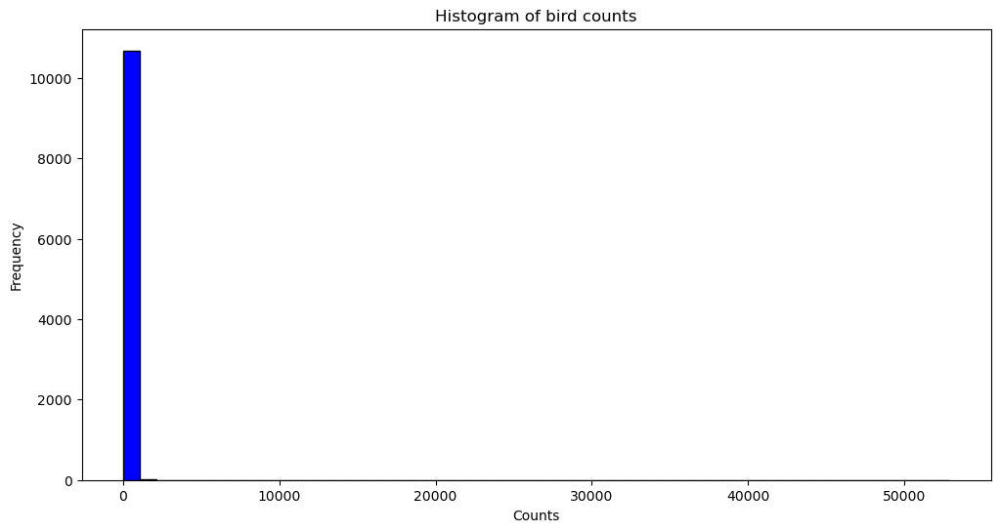

In [123]:
#use matplotlib to plot the histogram swith the x and y axis labels 
plt.figure(figsize=(12,6))
plt.hist(nbirds_nb['counts'], bins=50, color='blue', edgecolor='black')
plt.title('Histogram of bird counts')
plt.xlabel('Counts')
plt.ylabel('Frequency')
plt.show()


In [124]:
# Plotting choropleth map of pop_count column
nbirds_nb.explore(
    tiles='cartodbpositron',
    column='counts',
    height='100%',
    width='100%',
    scheme='fisherjenks',
    k=10,
    cmap='Oranges',
    style_kwds={
        'stroke': True,
        'edgecolor': 'k',
        'linewidth': 0.03,
        'fillOpacity': 0.7
        },
    legend_kwds={
        'colorbar': False,
        'fmt': '{:.0f}'
        }
    )

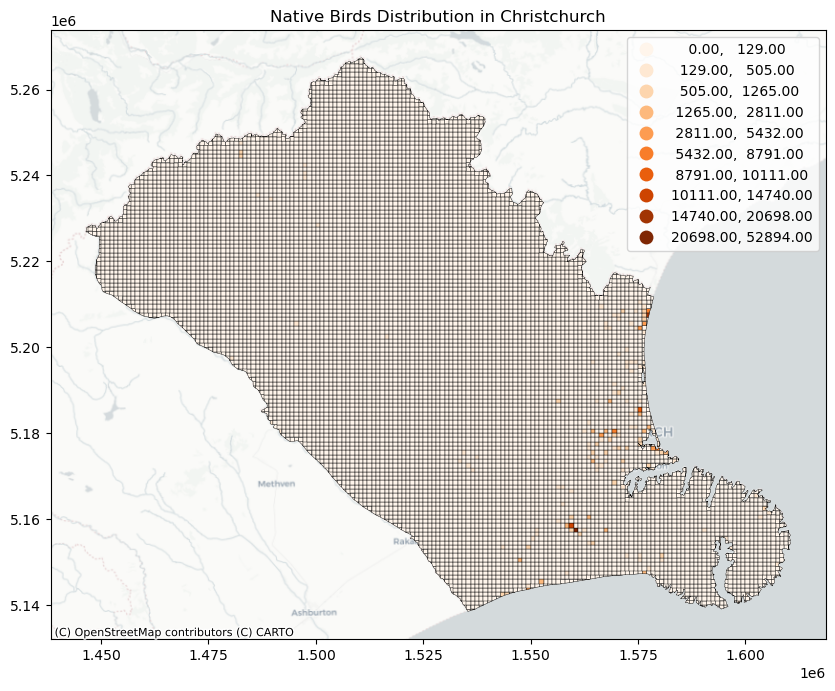

In [125]:
# map visualisation 

import matplotlib.pyplot as plt
import numpy as np

# add basemaps using `contextily`
import contextily as ctx

# initiate the map
fig, ax = plt.subplots(figsize=(10, 10))

# creating the map with 6 equak intervals - you can change these is you wish (https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.plot.html)
nbirds_nb.plot(column="counts", scheme='fisherjenks', k=10, cmap="Oranges", 
               edgecolor="black", linestyle="-", linewidth=0.3, 
               # plot the polygons with black and solid outlines
               missing_kwds={ "color": "lightgrey", "label": "Data not available"},
               # in case there are any areas with Nan - there shouldn't be in this plot but you may have some in your data if you reuse this code
               legend=True, ax=ax,)

# 

ax.set_title("Native Birds Distribution in Christchurch") # Set the title of each subplot

# add a basemap
ctx.add_basemap(ax, crs='epsg:2193', source=ctx.providers.CartoDB.Positron)

# show the plot
plt.show()

#### Spatial Autocorrelation

In [126]:
# Spatial similarity
import libpysal as lp

nbirds_nb = nbirds_nb.loc[~nbirds_nb.geom_type.isin(['Point', 'GeometryCollection']),:]
# remove Point and GeometryCollection in geometry otherwise get a TypeError

#Generate weights matrix - use_index = use index of df as ids to index the spatial weights object - we are not using this
wq =  weights.contiguity.Queen.from_dataframe(nbirds_nb, use_index=False)

#Row-standardise the weights
wq.transform = 'r'

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

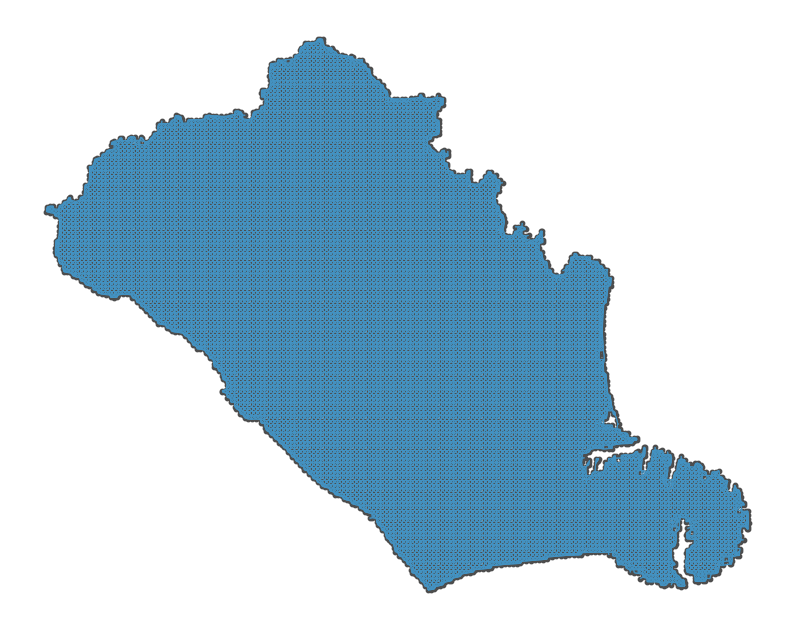

In [127]:
# Plotting to visualize spatial weights
plot_spatial_weights(wq, nbirds_nb)

### Quantifying Attribute Similarity using Spatial Lag

In [128]:

y = nbirds_nb['counts']
ylag = lp.weights.lag_spatial(wq, y)
ylag

array([0., 0., 0., ..., 0., 0., 0.])

In [129]:
import mapclassify as mc
ylagq5 = mc.Quantiles(ylag, k=5)

/home/ztang/miniforge3/envs/deepl1/lib/python3.12/site-packages/mapclassify/classifiers.py:1653: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 3.
  self.bins = quantile(y, k=k)


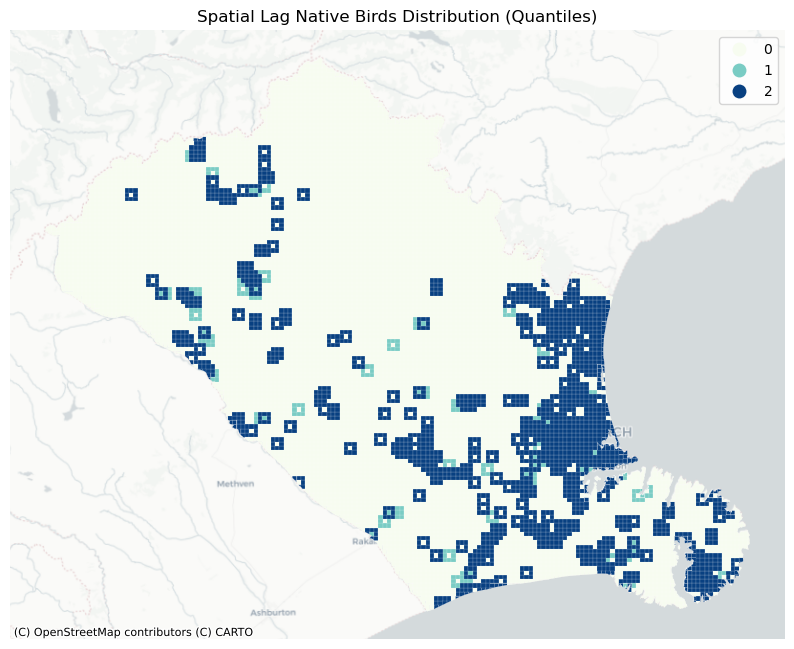

In [130]:
import contextily as ctx
f, ax = plt.subplots(1, figsize=(10, 10))
nbirds_nb.assign(cl=ylagq5.yb).plot(column='cl', categorical=True, \
        k=5, cmap='GnBu', linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)

ax.set_axis_off()
plt.title("Spatial Lag Native Birds Distribution (Quantiles)")

# add a basemap
ctx.add_basemap(ax, crs='epsg:2193', source=ctx.providers.CartoDB.Positron)

plt.show()

In [131]:
nbirds_nb['lag_count'] = ylag

/home/ztang/miniforge3/envs/deepl1/lib/python3.12/site-packages/mapclassify/classifiers.py:1653: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 2.
  self.bins = quantile(y, k=k)
/home/ztang/miniforge3/envs/deepl1/lib/python3.12/site-packages/mapclassify/classifiers.py:1653: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 3.
  self.bins = quantile(y, k=k)


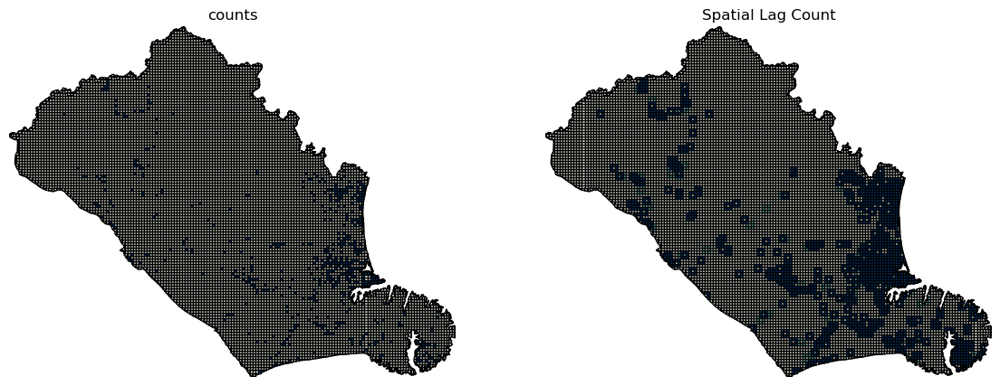

In [132]:
f,ax = plt.subplots(1,2,figsize=(14,14))
nbirds_nb.plot(column='counts', ax=ax[0], edgecolor='k',
        scheme="quantiles",  k=5, cmap='GnBu')
ax[0].axis(nbirds_nb.total_bounds[np.asarray([0,2,1,3])])
ax[0].set_title("counts")

nbirds_nb.plot(column='lag_count', ax=ax[1], edgecolor='k',
        scheme='quantiles', cmap='GnBu', k=5)
ax[1].axis(nbirds_nb.total_bounds[np.asarray([0,2,1,3])])
ax[1].set_title("Spatial Lag Count")
ax[0].axis('off')
ax[1].axis('off')
plt.show()

In [133]:
wq.weights

{0: [0.3333333333333333, 0.3333333333333333, 0.3333333333333333],
 1: [0.2, 0.2, 0.2, 0.2, 0.2],
 2: [0.3333333333333333, 0.3333333333333333, 0.3333333333333333],
 3: [0.2, 0.2, 0.2, 0.2, 0.2],
 4: [0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125],
 5: [0.2, 0.2, 0.2, 0.2, 0.2],
 6: [0.3333333333333333, 0.3333333333333333, 0.3333333333333333],
 7: [0.2, 0.2, 0.2, 0.2, 0.2],
 8: [0.2, 0.2, 0.2, 0.2, 0.2],
 9: [0.2, 0.2, 0.2, 0.2, 0.2],
 10: [0.3333333333333333, 0.3333333333333333, 0.3333333333333333],
 11: [0.3333333333333333, 0.3333333333333333, 0.3333333333333333],
 12: [0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285],
 13: [0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285],
 14: [0.3333333333333333, 0.3333333333333333, 0.3333333333333333],
 15: [0.3333333333333

In [134]:
wq.neighbors

{0: [1, 3, 4],
 1: [0, 2, 3, 4, 5],
 2: [1, 4, 5],
 3: [0, 1, 4, 12, 13],
 4: [0, 1, 2, 3, 5, 12, 13, 14],
 5: [1, 2, 4, 13, 14],
 6: [17, 18, 7],
 7: [17, 18, 19, 6, 8],
 8: [18, 19, 20, 7, 9],
 9: [19, 20, 21, 8, 10],
 10: [9, 20, 21],
 11: [26, 27, 12],
 12: [3, 4, 27, 26, 11, 28, 13],
 13: [3, 4, 5, 27, 12, 28, 14],
 14: [13, 4, 5],
 15: [16, 33, 32],
 16: [32, 33, 17, 34, 15],
 17: [16, 33, 34, 35, 18, 6, 7],
 18: [34, 35, 36, 6, 7, 8, 17, 19],
 19: [35, 36, 37, 7, 8, 9, 18, 20],
 20: [36, 37, 38, 8, 9, 10, 19, 21],
 21: [20, 37, 38, 39, 22, 9, 10],
 22: [21, 38, 23, 39, 40],
 23: [22, 39, 40, 24, 41],
 24: [23, 40, 25, 42, 41],
 25: [26, 24, 41, 42, 43],
 26: [25, 27, 43, 42, 11, 12, 44],
 27: [43, 11, 12, 13, 44, 45, 26, 28],
 28: [13, 29, 46, 27, 12, 45, 44],
 29: [28, 45, 46],
 30: [48, 49, 31],
 31: [48, 49, 32, 50, 30],
 32: [16, 33, 49, 50, 51, 31, 15],
 33: [32, 34, 15, 16, 17, 50, 51, 52],
 34: [33, 35, 16, 17, 18, 51, 52, 53],
 35: [34, 36, 17, 18, 19, 52, 53, 54],
 36: 

### Global spatial autocorrelation
Binary Case

In [135]:
y

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
10713    0.0
10714    0.0
10715    0.0
10716    0.0
10717    0.0
Name: counts, Length: 10718, dtype: float64

In [136]:
y.median()

0.0

In [137]:
yb = y > y.median()
sum(yb)

580

In [138]:
yb = y > y.median()

#Replace the boolean values with 0 (False), 1 (True)
labels = ["0 Low", "1 High"]
yb = [labels[i] for i in 1*yb] 

#Add it as a column
nbirds_nb['yb'] = yb
nbirds_nb.head(5)

,GridID,counts,geometry,lag_count,yb
0,E14465N52265,0.0,"POLYGON ((1447000 5226724.191, 1446970.946 522...",0.0,0 Low
1,E14465N52275,0.0,"POLYGON ((1447000 5227000, 1446505.094 5227000...",0.0,0 Low
2,E14465N52285,0.0,"POLYGON ((1446896.087 5228000, 1446946.645 522...",0.0,0 Low
3,E14475N52265,0.0,"POLYGON ((1448000 5227000, 1448000 5226066.072...",0.0,0 Low
4,E14475N52275,0.0,"POLYGON ((1448000 5228000, 1448000 5227000, 14...",0.0,0 Low


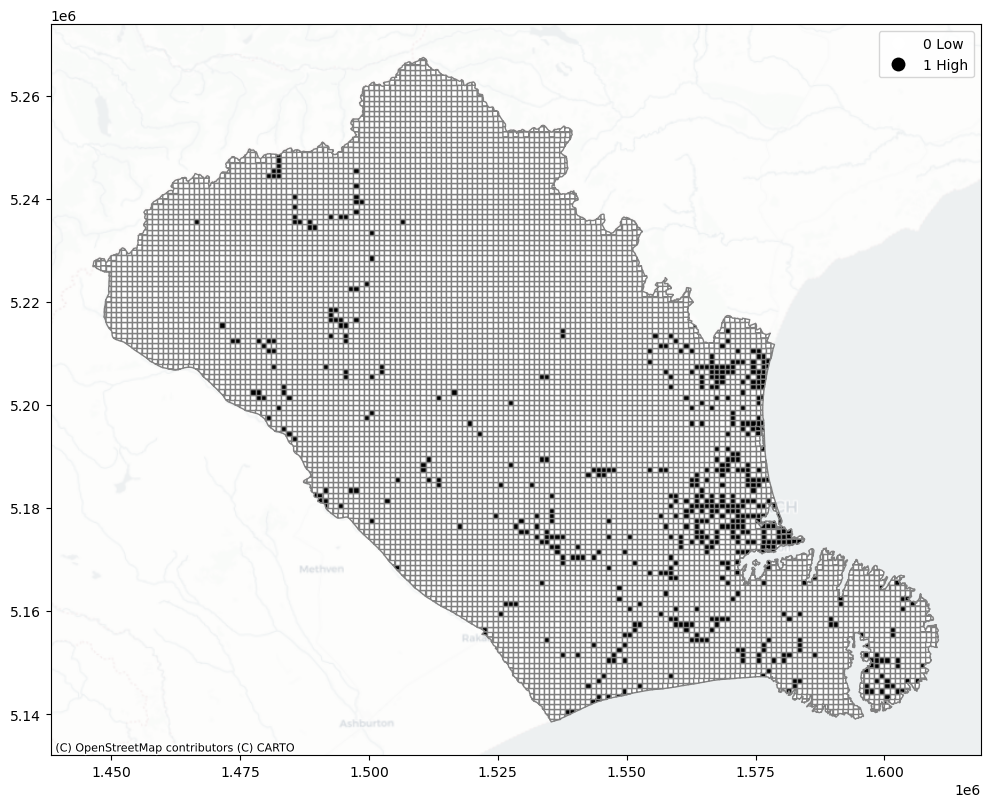

In [139]:
fig, ax = plt.subplots(figsize=(12,12), subplot_kw={'aspect':'equal'})
nbirds_nb.plot(column='yb', cmap='binary', edgecolor='grey', legend=True, ax=ax)

# add a basemap
ctx.add_basemap(ax, crs='epsg:2193', source=ctx.providers.CartoDB.Positron,alpha =0.4)

plt.show()

### Join counts

In [140]:
import esda 
yb = 1 * (y > y.median()) # convert back to binary - 0's and 1's
wq =  lp.weights.Queen.from_dataframe(nbirds_nb, use_index=False)

#Create a binary matrix, 'b'
wq.transform = 'b'
np.random.seed(66)

jc = esda.join_counts.Join_Counts(yb, wq)

In [141]:
jc.bb

649.0

In [142]:
jc.ww

37692.0

In [143]:
jc.bw

3176.0

In [144]:
jc.bb + jc.ww + jc.bw

41517.0

In [145]:
wq.s0 / 2

41517.0

In [146]:
jc.bb

649.0

In [147]:
jc.mean_bb

120.92092092092092

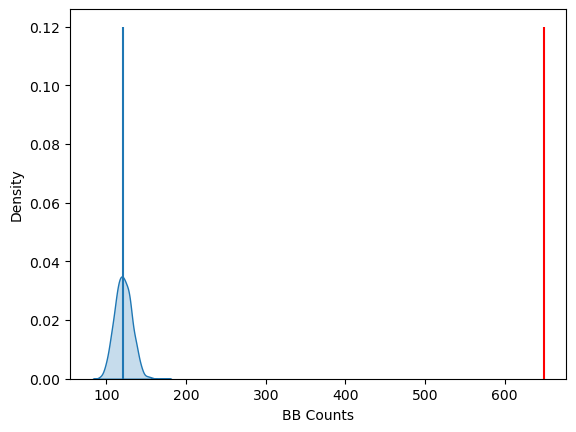

In [148]:
import seaborn as sbn
sbn.kdeplot(jc.sim_bb, fill=True)
plt.vlines(jc.bb, 0, .12, color='r')
plt.vlines(jc.mean_bb, 0,.12)
plt.xlabel('BB Counts')
plt.show()

In [149]:
jc.p_sim_bb

0.001

### Continuous Case

In [150]:
wq.transform = 'r'

In [151]:
#Set our variable of interest
y = nbirds_nb['counts']

In [152]:
np.random.seed(66)
mi = esda.moran.Moran(y, wq)
mi.I

0.08922812081171236

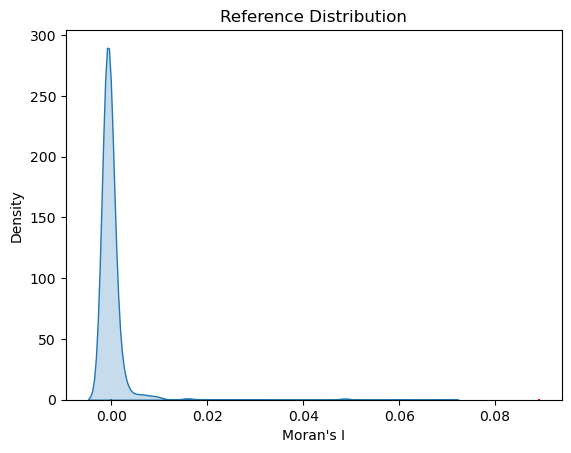

In [153]:
import seaborn as sbn
sbn.kdeplot(mi.sim, fill=True)
plt.vlines(mi.I, 0, 1, color='r')
plt.vlines(mi.EI, 0,1)
plt.xlabel("Moran's I")
plt.title('Reference Distribution')
plt.show()

In [154]:
mi.p_sim

0.001

### Local Autocorrelation: Moran’s Plot

In [155]:
#Transform the weights matrix back to row-standardised to calculate the spatial lag price
wq.transform = 'r'
lag_counts = lp.weights.lag_spatial(wq, nbirds_nb['counts'])

In [156]:
# counts = nbirds_nb['counts']

# #create a straight line of best fit for the association between price and lag price (sort of a linear regression)
# #a = intercept, b= slope
# b, a = np.polyfit(price, lag_price, 1)

# f, ax = plt.subplots(1, figsize=(12, 12))

# #Plot the points
# plt.plot(price, lag_price, '.', color='firebrick')

# # Split the plot into quadrants
# #dashed vert at mean of the price
# plt.vlines(price.mean(), lag_price.min(), lag_price.max(), linestyle='--')
# # dashed horizontal at mean of lagged price 
# plt.hlines(lag_price.mean(), price.min(), price.max(), linestyle='--')

# # red line of best fit using global I as slope
# plt.plot(price, a + b*price, 'r')
# plt.title('Moran Scatterplot')
# plt.ylabel('Spatial Lag of Price')
# plt.xlabel('Price')

# # Label quadrants
# plt.text(200, 170, "hotspot", fontsize=10)
# plt.text(200, 100, "diamond", fontsize=10)
# plt.text(30, 170, "doughnut", fontsize=10)
# plt.text(30, 100, "coldspot", fontsize=10)
# plt.show()

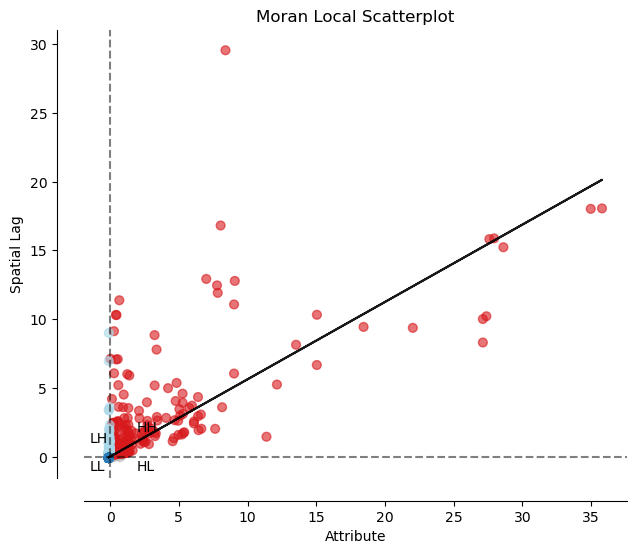

In [157]:
# Local Moran's I
local_moran = Moran_Local(lag_counts, wq)

# Plotting Local Moran's I scatterplot of pop_count
fig, ax = moran_scatterplot(local_moran, p=0.05);

plt.text(1.95, 1.8, 'HH', fontsize=10)
plt.text(1.95, -1.0, 'HL', fontsize=10)
plt.text(-1.5, 1, 'LH', fontsize=10)
plt.text(-1.5, -1, 'LL', fontsize=10)
plt.show()

In [158]:
li = esda.moran.Moran_Local(y, wq)
li.q

array([3, 3, 3, ..., 3, 3, 3])

In [159]:
(li.p_sim < 0.05).sum()

847

### Hot Spots, Cold Spots, Doughnuts and Diamonds

In [160]:
#Create a pandas series of booleans for SA2 areas with p-values < 0.05 for each of the 4 quadrants
sig = li.p_sim < 0.05
hotspot = sig * li.q==1
coldspot = sig * li.q==3
doughnut = sig * li.q==2
diamond = sig * li.q==4

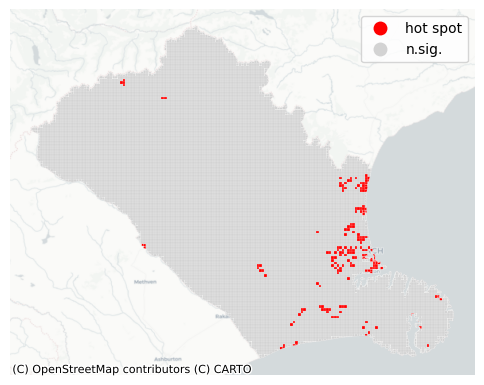

In [161]:
#Label each Hotspot
spots = ['n.sig.', 'hot spot']
labels = [spots[i] for i in hotspot*1]

df = nbirds_nb

from matplotlib import colors
hmap = colors.ListedColormap(['red', 'lightgrey'])
f, ax = plt.subplots(1, figsize=(6, 6))
df.assign(cl=labels).plot(column='cl', categorical=True, \
        k=2, cmap=hmap, linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)
ax.set_axis_off()

# add a basemap
ctx.add_basemap(ax, crs='epsg:2193', source=ctx.providers.CartoDB.Positron)

plt.show()

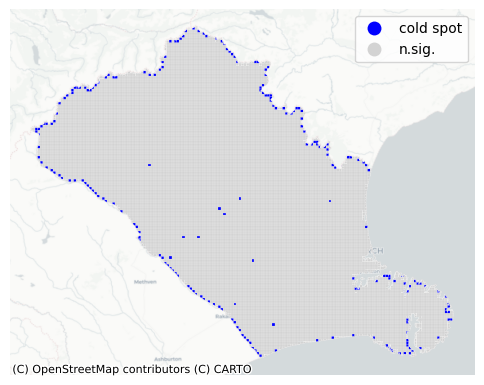

In [162]:
#Label each Cold spot
spots = ['n.sig.', 'cold spot']
labels = [spots[i] for i in coldspot*1]

df = nbirds_nb

from matplotlib import colors
hmap = colors.ListedColormap(['blue', 'lightgrey'])
f, ax = plt.subplots(1, figsize=(6, 6))
df.assign(cl=labels).plot(column='cl', categorical=True, \
        k=2, cmap=hmap, linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)
ax.set_axis_off()

# add a basemap
ctx.add_basemap(ax, crs='epsg:2193', source=ctx.providers.CartoDB.Positron)

plt.show()

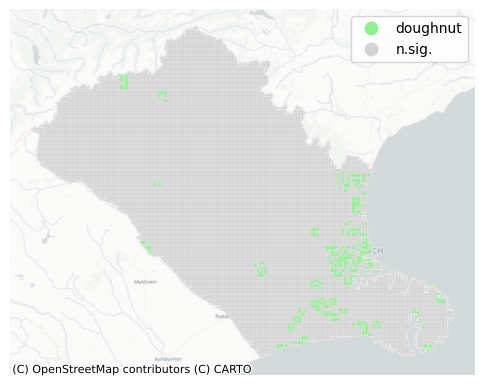

In [163]:
#Label each doughnut
spots = ['n.sig.', 'doughnut']
labels = [spots[i] for i in doughnut*1]

df = df

from matplotlib import colors
hmap = colors.ListedColormap(['lightgreen', 'lightgrey'])
f, ax = plt.subplots(1, figsize=(6, 6))
df.assign(cl=labels).plot(column='cl', categorical=True, \
        k=2, cmap=hmap, linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)
ax.set_axis_off()

# add a basemap
ctx.add_basemap(ax, crs='epsg:2193', source=ctx.providers.CartoDB.Positron)
plt.show()

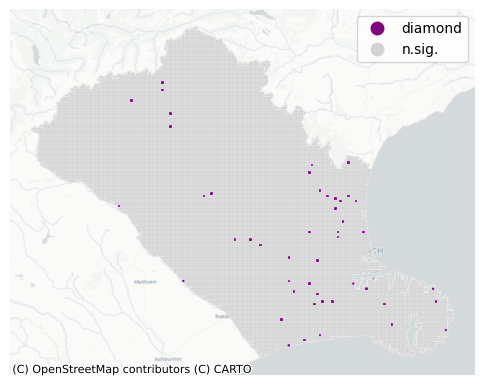

In [164]:
#Label each diamond
spots = ['n.sig.', 'diamond']
labels = [spots[i] for i in diamond*1]

df = nbirds_nb
from matplotlib import colors
hmap = colors.ListedColormap(['purple', 'lightgrey'])
f, ax = plt.subplots(1, figsize=(6, 6))
df.assign(cl=labels).plot(column='cl', categorical=True, \
        k=2, cmap=hmap, linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)
ax.set_axis_off()

# add a basemap
ctx.add_basemap(ax, crs='epsg:2193', source=ctx.providers.CartoDB.Positron)
plt.show()

In [181]:
#Create an array for SA2 areas with p-values < 0.05 for all 4 quadrants combined
sig = 1 * (li.p_sim < 0.01)
hotspot = 1 * (sig * li.q==1)
coldspot = 3 * (sig * li.q==3)
doughnut = 2 * (sig * li.q==2)
diamond = 4 * (sig * li.q==4)
spots = hotspot + coldspot + doughnut + diamond
spots

array([0, 0, 0, ..., 0, 0, 0])

In [166]:
import rioxarray as rxr

# Read the raster file (e.g., GeoTIFF)
temp_raster = rxr.open_rasterio('/home/ztang/canterbury_birds/Canterbury_birds/GIS_file/cantburry_average_temp_1.tif')

# Print the metadata and information about the raster
print(temp_raster)

# If it's a multi-band raster, you can check the number of bands:
print(f"Number of bands: {temp_raster.rio.count}")

# If it's a single-band raster, you can access the data directly:
band_data = temp_raster[1]  # Get the first band (index 0)

# View raster data shape (dimensions: bands, height, width)
print(band_data.shape)


<xarray.DataArray (band: 2, y: 611, x: 625)> Size: 6MB
[763750 values with dtype=float64]
Coordinates:
  * band         (band) int64 16B 1 2
  * x            (x) float64 5kB 1.204e+06 1.204e+06 ... 1.826e+06 1.828e+06
  * y            (y) float64 5kB 5.49e+06 5.49e+06 ... 4.882e+06 4.88e+06
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0
    long_name:      ('LST_Day_1km', 'LST_Day_Celsius')
Number of bands: 2
(611, 625)


In [167]:
# Plot the temp_raster
temp_raster.rio.crs


CRS.from_epsg(2193)

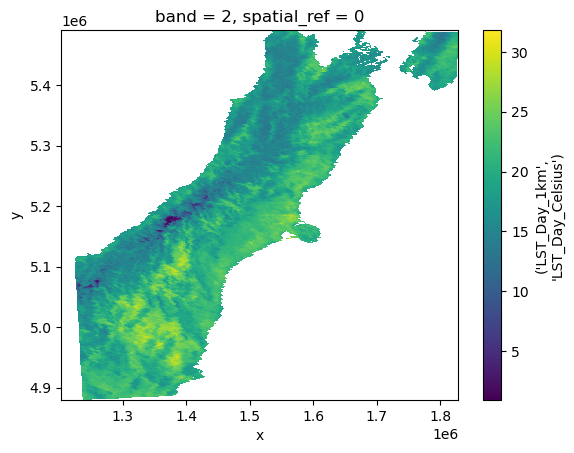

In [168]:
temp_raster[1].plot()


In [169]:
# clip cbirds_temp to dis_3
temp_degree = temp_raster[1]


In [170]:
temp_clipped = temp_degree.rio.clip(dis_3.geometry)

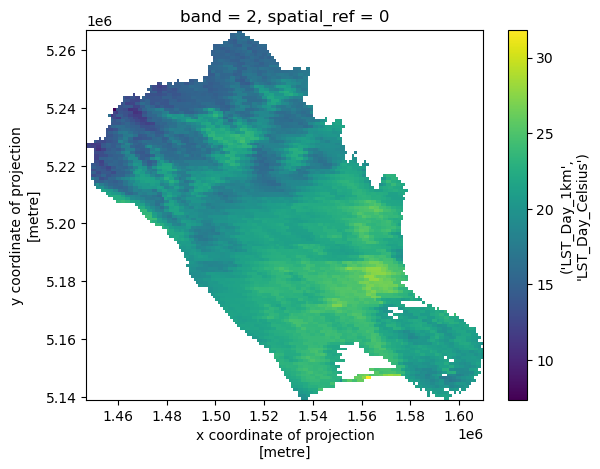

In [171]:
temp_clipped.plot()

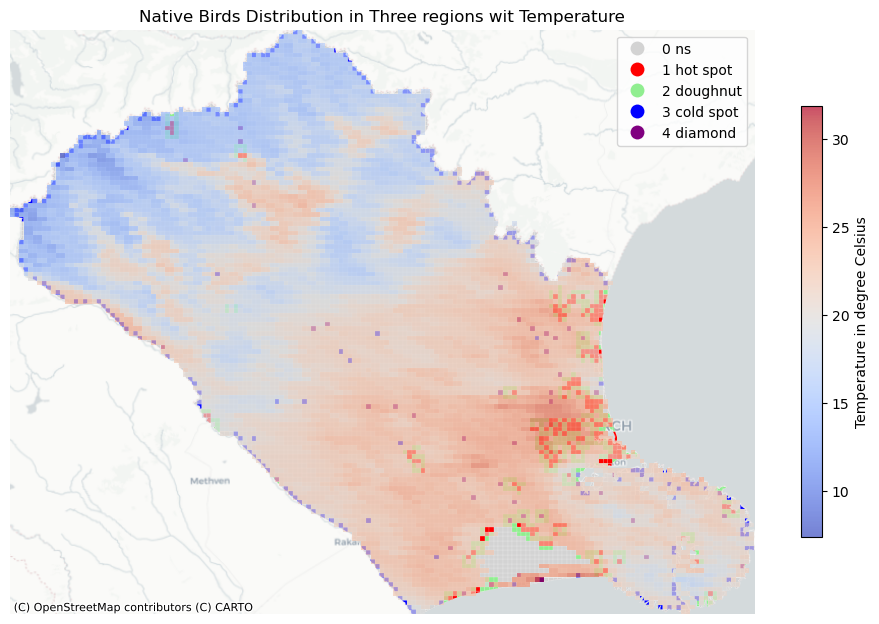

In [172]:
#Label each value in the array
spot_labels = [ '0 ns', '1 hot spot', '2 doughnut', '3 cold spot', '4 diamond']
labels = [spot_labels[i] for i in spots] 

from matplotlib import colors
hmap = colors.ListedColormap([ 'lightgrey', 'red', 'lightgreen', 'blue', 'purple'])
f, ax = plt.subplots(1, figsize=(12, 14))
nbirds_nb.assign(cl=labels).plot(column='cl', categorical=True, \
        k=2, cmap=hmap, linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)
ax.set_axis_off()

# add a basemap
ctx.add_basemap(ax, crs='epsg:2193', source=ctx.providers.CartoDB.Positron)

# add the temp_mean of cbirds_temp_dis_3 to the plot
temp_plot = temp_clipped.plot(ax=ax, cmap='coolwarm', alpha=0.7, add_colorbar=False)
ax.set_title('Native Birds Distribution in Three regions wit Temperature')
cbar = plt.colorbar(temp_plot, ax=ax, orientation='vertical', shrink=0.4)

cbar.set_label('Temperature in degree Celsius')
plt.show()

import soil type shap file

<Axes: >

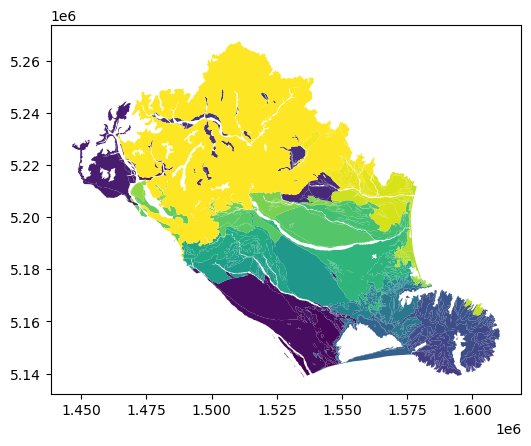

In [173]:
# read in soi_trace_elements_level_2.zip
soi = gpd.read_file('/home/ztang/canterbury_birds/Canterbury_birds/GIS_file/Soil_Trace_Elements_Level_2.zip')

# clip soi to dis_3
soi_clipped = soi.clip(dis_3.geometry)

# plot soi_clipped
soi_clipped.plot(cmap='viridis', legend=True)

import wetland_vegetation and open water habitat


<Axes: >

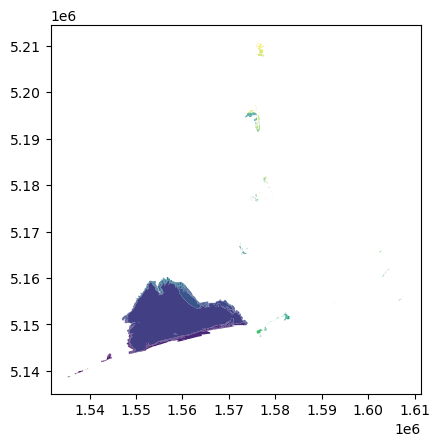

In [174]:
#import wetland shapefile
wetland = gpd.read_file('/home/ztang/canterbury_birds/Canterbury_birds/GIS_file/Canterbury_Coastal_Wetland_Vegetation___habitats.zip')

# clip wetland to dis_3
wetland_clipped = wetland.clip(dis_3.geometry)

# plot wetland_clipped
wetland_clipped.plot(cmap='viridis', legend=True)

<Axes: >

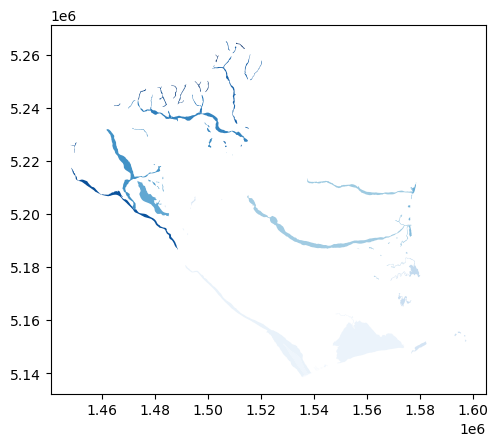

In [175]:
# import open water shapefile
open_water = gpd.read_file('GIS_file/Native_Bird_River_and_Open_Water_Habitat.zip')

# clip open_water to dis_3
open_water_clipped = open_water.clip(dis_3.geometry)

# plot open_water_clipped
open_water_clipped.plot(cmap='Blues', legend=True)

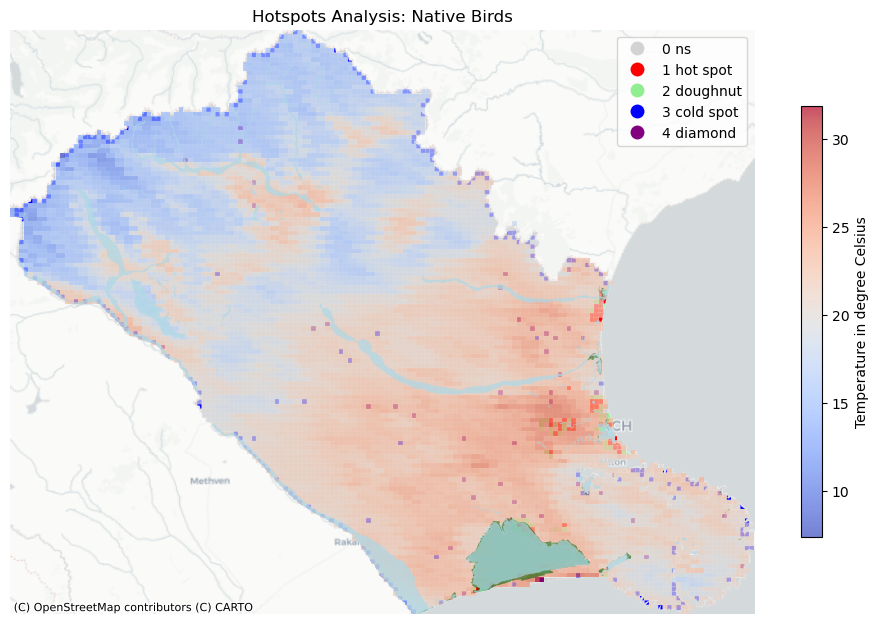

In [187]:
#Label each value in the array
spot_labels = [ '0 ns', '1 hot spot', '2 doughnut', '3 cold spot', '4 diamond']
labels = [spot_labels[i] for i in spots] 

from matplotlib import colors
hmap = colors.ListedColormap([ 'lightgrey', 'red', 'lightgreen', 'blue', 'purple'])
f, ax = plt.subplots(1, figsize=(12, 14))
nbirds_nb.assign(cl=labels).plot(column='cl', categorical=True, \
        k=2, cmap=hmap, linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)
ax.set_axis_off()

# add a basemap
ctx.add_basemap(ax, crs='epsg:2193', source=ctx.providers.CartoDB.Positron)

# add the temp_mean of cbirds_temp_dis_3 to the plot
temp_plot = temp_clipped.plot(ax=ax, cmap='coolwarm', alpha=0.7, add_colorbar=False)
ax.set_title('Hotspots Analysis: Native Birds')
cbar = plt.colorbar(temp_plot, ax=ax, orientation='vertical', shrink=0.4)

# add the wetland_clipped to the plot
wetland_clipped.plot(ax=ax, color='darkgreen', alpha=0.6)

# add the open_water_clipped to the plot
open_water_clipped.plot(ax=ax, color='lightblue', alpha=0.7)

cbar.set_label('Temperature in degree Celsius')
plt.show()